In [12]:
import numpy as np 
import os 
import xarray as xr
import pandas as pd
#from scipy.io import savemat
from collections import OrderedDict
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
import matplotlib as mpl
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import ListedColormap

import mplcursors

In [13]:
max_display_options = ['display.max_seq_items', 'display.max_colwidth', 'display.max_dir_items', 'display.max_columns', 'display.max_rows']
for param in range(0,len(max_display_options)):
    pd.set_option(max_display_options[param], None)

In [14]:
#Get merged data from USOS
all_days_filepath = '../../CampaignData_and_Merges/R0/CSL_MobileLab_Parked/merged/rev_30min/all_CSL_MobileLab_Parked_rev30minv4.nc'
all_days_filepath_load = xr.open_dataset(all_days_filepath)
df_alldays = all_days_filepath_load.to_dataframe()
df_alldays.set_index('time_local', inplace=True)

## Data availability for NOx and Ozone

In [4]:
spec_list = ['O3_ppbv', 'NO_LIF', 'NO2_LIF']

need2fill= {'O3_ppbv':True,
            'NO_LIF':True,
            'NO2_LIF':True}
vars2fill=[key for key,value in need2fill.items() if value ==True]

In [5]:
df_usos_species_data_avail=pd.DataFrame(index=df_alldays.index)

for col in range(0, len(spec_list)):
    # Everything that was a NaN or negative is assigned a 0, positive values are assigned a 1
    df_usos_species_data_avail[spec_list[col]] = np.where((df_alldays[spec_list[col]] > 0) & (~df_alldays[spec_list[col]].isna()), 1, 0 )

df_usos_species_data_avail_transposed=df_usos_species_data_avail.T

/var/folders/6m/87kslmb13vl09hjpjjpddb2h0000gn/T/ipykernel_91360/2537166564.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_top.set_xticklabels(midnight_labels)


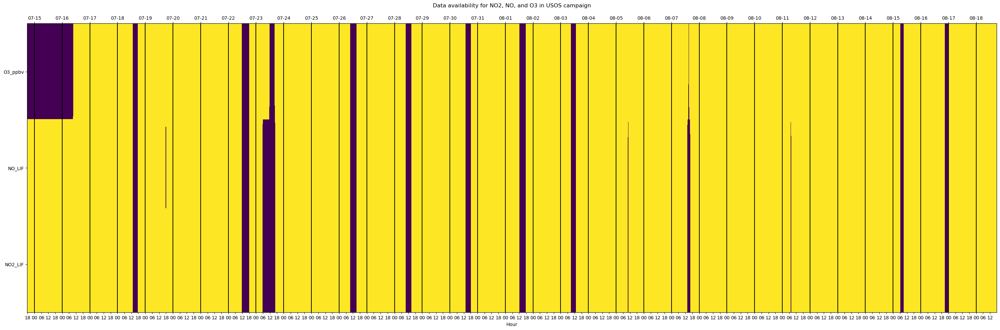

In [10]:
#alter viridis colormap to only have 2 color options
viridis = plt.cm.viridis
colors = [viridis(0.0), viridis(1.0)]
two_color_viridis = ListedColormap(colors)

# Create the heatmap using imshow
fig, ax = plt.subplots(figsize=(30, 10))
ax.imshow(df_usos_species_data_avail_transposed, aspect='auto', cmap=two_color_viridis)
# Set x-ticks and y-ticks
ax.set_xticks(ticks=range(0,len(df_usos_species_data_avail_transposed.columns),12), labels=df_usos_species_data_avail_transposed.columns.strftime('%H')[0::12])
ax.set_yticks(ticks=np.arange(len(df_usos_species_data_avail_transposed.index)), labels=df_usos_species_data_avail_transposed.index)
ax.set_xlabel('Hour')

for pos in range(12,len(df_usos_species_data_avail_transposed.columns),48):
    plt.axvline(pos, color = 'black')
#    plt.axvline(df_allvars_transposed.columns.strftime('%H%M')[12::48], color = 'black')           

ax_top = ax.twiny()
ax_top.set_xlim(ax.get_xlim())
midnight_labels = []
for date in range(12,len(df_usos_species_data_avail_transposed.columns),48):
    date_labels = df_usos_species_data_avail_transposed.columns.strftime('%m-%d')[date]
    midnight_labels.append(date_labels)

ax_top.set_xticklabels(midnight_labels)
ax_top.set_xticks(ticks=range(12,len(df_usos_species_data_avail_transposed.columns),48))

# Set labels and title

plt.ylabel('Measurement')
plt.title('Data availability for NO2, NO, and O3 in USOS campaign\n')


# Show plot
plt.tight_layout()
plt.show()

#save_filepath_merger = '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_merges/data_availability_plots/three_day_availability_'+ str(date_to_plot) + '.png'
#plt.savefig(fname = save_filepath_merger,format='png')
#print('Saved figure as:' + str(save_filepath_merger))

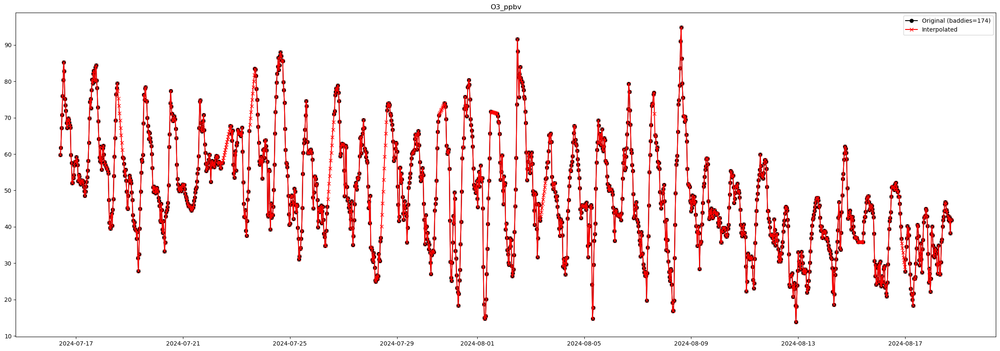

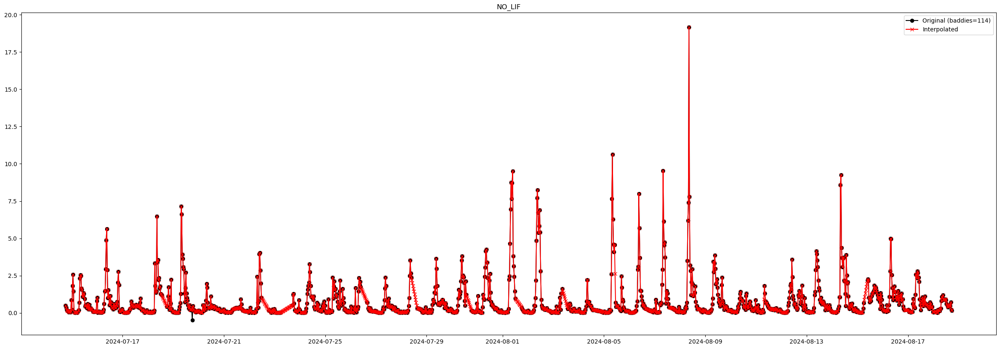

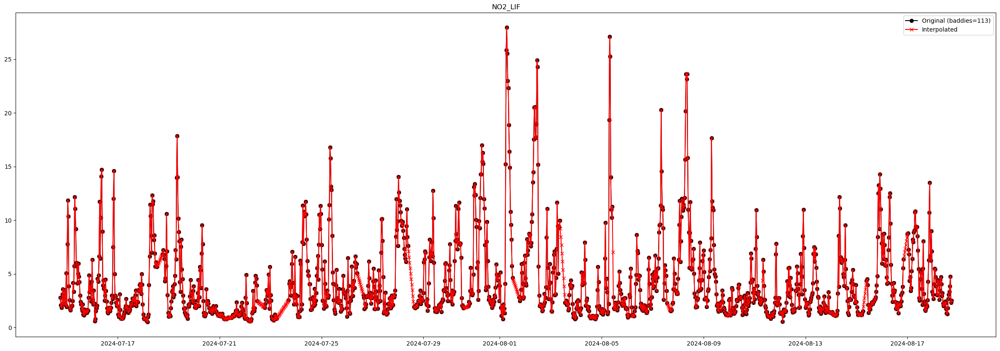

In [7]:
df_interp=df_alldays.copy()

for i,col in enumerate(vars2fill):
    # Set any negative values to NaN so we can interp them... 
    df_interp[col] = df_interp[col].mask(df_interp[col] < 0, np.nan)
                               
    # Calc number of points that are negative or Nans: 
    n_baddies= len([item for item in df_alldays[col] if item <0 or np.isnan(item)]) 

    if n_baddies > 0: 
        #apply the linear interpolation
        df_interp[col] = df_interp[col].interpolate(method='linear')
        
        #Plot it so we can take a look at it... 
        fig, ax = plt.subplots(figsize = (30,10))
        plt.plot(df_alldays.index, df_alldays[col], color='k', marker='o',label=f'Original (baddies={n_baddies})')
        plt.plot(df_interp.index, df_interp[col], color='r', marker='x', label='Interpolated')
        plt.legend()
        plt.title(col)

In [8]:
#adds padding of NaNs for first day and last day of campaign, since they need to have the same length of time as the other days in order to plot
new_start_time = pd.Timestamp('2024-07-14 00:00:00')
new_end_time = pd.Timestamp('2024-08-18 23:30:00')

# Create a new datetime index from new_start to the end of existing index with same frequency
new_index = pd.date_range(start=new_start_time, end=new_end_time, freq='30T')

# Reindex the dataframe to include new rows
df_new_times = df_interp.reindex(new_index)

# Now df_expanded has rows starting at 00:00 with NaNs for the new rows
print(df_new_times)

                       O3_ppbv  File_Index  HONO_CIMS   PAN_CIMS  APAN_CIMS  \
2024-07-14 00:00:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 00:30:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 01:00:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 01:30:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 02:00:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 02:30:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 03:00:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 03:30:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 04:00:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 04:30:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 05:00:00        NaN         NaN        NaN        NaN        NaN   
2024-07-14 05:30:00        NaN         NaN        Na

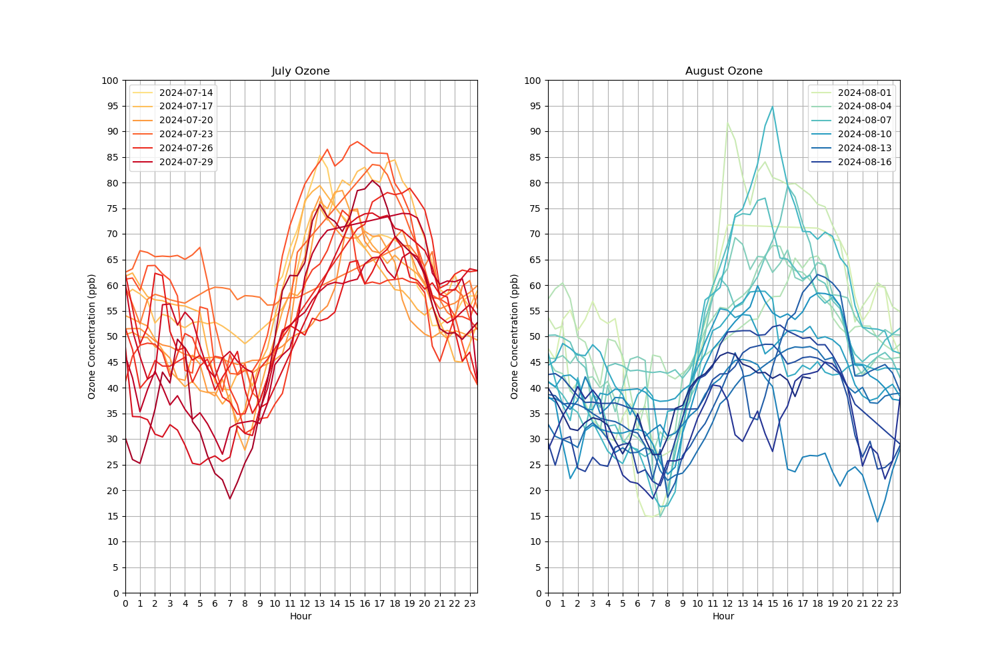

In [9]:
%matplotlib widget

fig, ax = plt.subplots(1,2, figsize = (15,10))
hour_range = np.arange(0,24,0.5)

cmap1 = mpl.colormaps['YlOrRd']
cmap2 = mpl.colormaps['YlGnBu']

# Create 20 color values for gradient in the colormap
color_values = np.linspace(0.2, 1, 20) 

#Loop through each day for July and plot the ozone values on first subplot
for day_val in range(0,18):
    days_indexing = df_new_times.index.date[day_val*48]
    one_day_df = df_new_times.sort_index().loc[str(days_indexing)]
    species_vals = one_day_df['O3_ppbv'].values
    toplot, = ax[0].plot(hour_range, species_vals, color=cmap1(color_values[day_val]), label = days_indexing)
    ax[0].set_xlabel('Hour')
    ax[0].set_ylabel('Ozone Concentration (ppb)')
    ax[0].set_xticks(np.arange(0,24))
    ax[0].set_ylim([0,100])
    ax[0].set_yticks(np.arange(0,105,5))
    ax[0].set_title('July Ozone')

#get labels for every 3 days to show on legend
handles, labels = ax[0].get_legend_handles_labels()

skip=3
selected_handles = handles[::skip]
selected_labels = labels[::skip]
ax[0].legend(selected_handles, selected_labels)
ax[0].margins(x=0)
ax[0].grid()

#Loop through each day for August and plot the ozone values on second subplot
for day_val in range(0,18):
    days_indexing = df_new_times.index.date[(day_val*48)+864]
    one_day_df = df_new_times.sort_index().loc[str(days_indexing)]
    species_vals = one_day_df['O3_ppbv'].values
    ax[1].plot(hour_range, species_vals, color=cmap2(color_values[day_val]), label = days_indexing)
    ax[1].set_xlabel('Hour')
    ax[1].set_ylabel('Ozone Concentration (ppb)')
    ax[1].set_xticks(np.arange(0,24))
    ax[1].set_ylim([0,100])
    ax[1].set_yticks(np.arange(0,105,5))
    ax[1].set_title('August Ozone')

#get labels for every 3 days to show on legend
handles, labels = ax[1].get_legend_handles_labels()

skip=3
selected_handles = handles[::skip]
selected_labels = labels[::skip]
ax[1].legend(selected_handles, selected_labels)
ax[1].margins(x=0)
ax[1].grid()

mplcursors.cursor()
plt.show()

## Data availability for VOCs

In [15]:
#Identify list of relevant VOCs we want data availability for
VOC_list = ['HCOOH_CIMS', 'Methanol_PTR', 'Acetonitrile_PTR', 'Acetaldehyde_PTR', 'Ethanol_PTR', 'Methanethiol_PTR', 
        'Acrolein_PTR', 'Acetone_Propanal_PTR', 'DMS_PTR', 'Isoprene_PTR', 'MVK_MACR_PTR', 'Benzene_PTR', 'Toluene_PTR', 
        'Styrene_PTR', 'Benzaldehyde_PTR', 'C8Aromatics_PTR', 'C9Aromatics_PTR', 'Naphthalene_PTR', 'Octanal_PTR', 
        'Monoterpenes_PTR', 'Nonanal_PTR', 'C7H4ClF3_PTR', 'D5_siloxane_PTR', 'C4H7NO5_CIMS', 'ISOPN_CIMS', 
        'C5H10O3_CIMS', 'C5H9NO5_CIMS', 'C10H17NO4_CIMS']

In [16]:
df_usos_vocs=pd.DataFrame(index=df_alldays.index)

for col in range(0, len(VOC_list)):
    # Everything that was a NaN or negative is assigned a 0, positive values are assigned a 1
    df_usos_vocs[VOC_list[col]] = np.where((df_alldays[VOC_list[col]] > 0) & (~df_alldays[VOC_list[col]].isna()), 1, 0 )

df_usos_vocs_transposed=df_usos_vocs.T

/var/folders/6m/87kslmb13vl09hjpjjpddb2h0000gn/T/ipykernel_91360/220371555.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_top.set_xticklabels(midnight_labels)


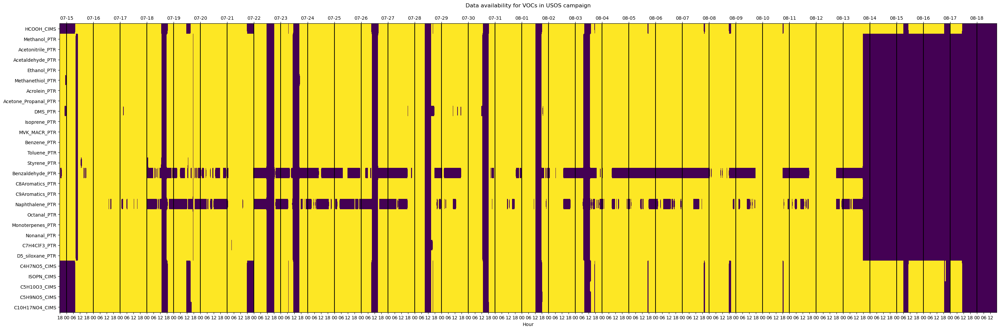

In [17]:
#alter viridis colormap to only have 2 color options
viridis = plt.cm.viridis
colors = [viridis(0.0), viridis(1.0)]
two_color_viridis = ListedColormap(colors)

# Create the heatmap using imshow
fig, ax = plt.subplots(figsize=(30, 10))
ax.imshow(df_usos_vocs_transposed, aspect='auto', cmap=two_color_viridis)
# Set x-ticks and y-ticks
ax.set_xticks(ticks=range(0,len(df_usos_vocs_transposed.columns),12), labels=df_usos_vocs_transposed.columns.strftime('%H')[0::12])
ax.set_yticks(ticks=np.arange(len(df_usos_vocs_transposed.index)), labels=df_usos_vocs_transposed.index)
ax.set_xlabel('Hour')

for pos in range(12,len(df_usos_vocs_transposed.columns),48):
    plt.axvline(pos, color = 'black')
#    plt.axvline(df_allvars_transposed.columns.strftime('%H%M')[12::48], color = 'black')           

ax_top = ax.twiny()
ax_top.set_xlim(ax.get_xlim())
midnight_labels = []
for date in range(12,len(df_usos_vocs_transposed.columns),48):
    date_labels = df_usos_vocs_transposed.columns.strftime('%m-%d')[date]
    midnight_labels.append(date_labels)

ax_top.set_xticklabels(midnight_labels)
ax_top.set_xticks(ticks=range(12,len(df_usos_vocs_transposed.columns),48))

# Set labels and title

plt.ylabel('Measurement')
plt.title('Data availability for VOCs in USOS campaign\n')

# Show plot
plt.tight_layout()
plt.show()

#save_filepath_merger = '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_merges/data_availability_plots/three_day_availability_'+ str(date_to_plot) + '.png'
#plt.savefig(fname = save_filepath_merger,format='png')
#print('Saved figure as:' + str(save_filepath_merger))

## Data availability for Halogens

In [18]:
halogens_list = ['Br2_CIMS', 'BrO_CIMS', 'Cl2_CIMS', 'ClNO2_CIMS', 'BrCl_CIMS']

In [19]:
df_usos_halogens=pd.DataFrame(index=df_alldays.index)

for col in range(0, len(halogens_list)):
    # Everything that was a NaN or negative is assigned a 0, positive values are assigned a 1
    df_usos_halogens[halogens_list[col]] = np.where((df_alldays[halogens_list[col]] > 0) & (~df_alldays[halogens_list[col]].isna()), 1, 0 )

df_usos_halogens_transposed=df_usos_halogens.T

/var/folders/6m/87kslmb13vl09hjpjjpddb2h0000gn/T/ipykernel_91360/3793230200.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_top.set_xticklabels(midnight_labels)


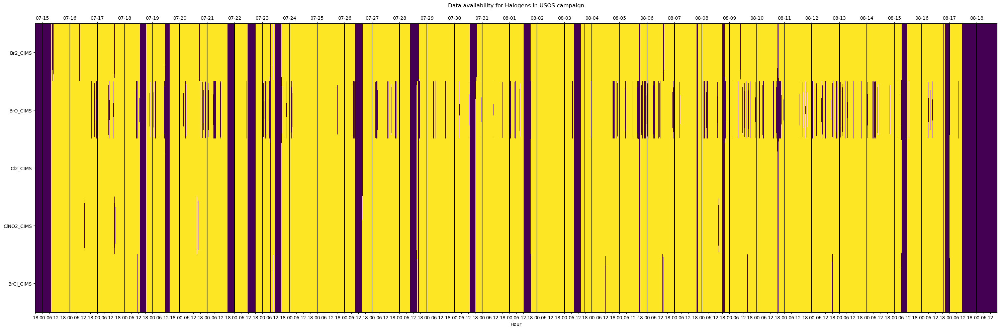

In [21]:
#alter viridis colormap to only have 2 color options
viridis = plt.cm.viridis
colors = [viridis(0.0), viridis(1.0)]
two_color_viridis = ListedColormap(colors)

# Create the heatmap using imshow
fig, ax = plt.subplots(figsize=(30, 10))
ax.imshow(df_usos_halogens_transposed, aspect='auto', cmap=two_color_viridis)
# Set x-ticks and y-ticks
ax.set_xticks(ticks=range(0,len(df_usos_halogens_transposed.columns),12), labels=df_usos_halogens_transposed.columns.strftime('%H')[0::12])
ax.set_yticks(ticks=np.arange(len(df_usos_halogens_transposed.index)), labels=df_usos_halogens_transposed.index)
ax.set_xlabel('Hour')
ax.grid(which='minor',axis='y', color = 'black', linewidth = 1)

for pos in range(12,len(df_usos_halogens_transposed.columns),48):
    plt.axvline(pos, color = 'black')
#    plt.axvline(df_allvars_transposed.columns.strftime('%H%M')[12::48], color = 'black')           

ax_top = ax.twiny()
ax_top.set_xlim(ax.get_xlim())
midnight_labels = []
for date in range(12,len(df_usos_halogens_transposed.columns),48):
    date_labels = df_usos_halogens_transposed.columns.strftime('%m-%d')[date]
    midnight_labels.append(date_labels)

ax_top.set_xticklabels(midnight_labels)
ax_top.set_xticks(ticks=range(12,len(df_usos_halogens_transposed.columns),48))

# Set labels and title

plt.ylabel('Measurement')
plt.title('Data availability for Halogens in USOS campaign\n')

# Show plot
plt.tight_layout()

plt.show()

#save_filepath_merger = '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_merges/data_availability_plots/three_day_availability_'+ str(date_to_plot) + '.png'
#plt.savefig(fname = save_filepath_merger,format='png')
#print('Saved figure as:' + str(save_filepath_merger))

In [22]:
halogens_list = ['Br2_CIMS', 'BrO_CIMS', 'Cl2_CIMS', 'ClNO2_CIMS', 'BrCl_CIMS']

need2fill= {'Br2_CIMS':True,
            'BrO_CIMS':True,
            'Cl2_CIMS':True,
            'ClNO2_CIMS':True,
            'BrCl_CIMS':True}
vars2fill=[key for key,value in need2fill.items() if value ==True]

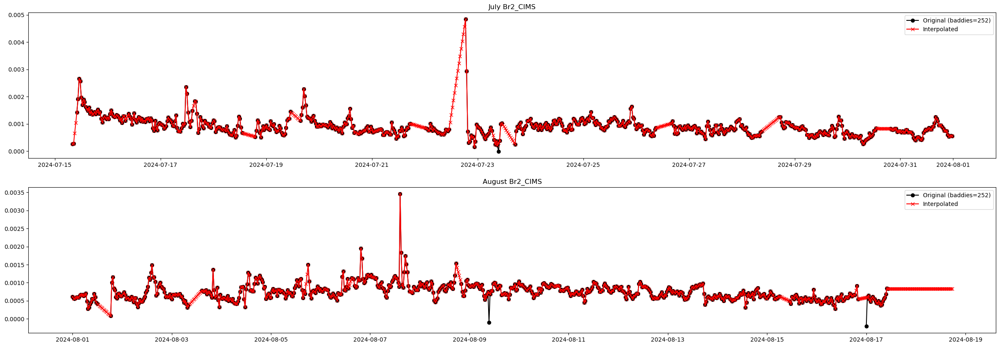

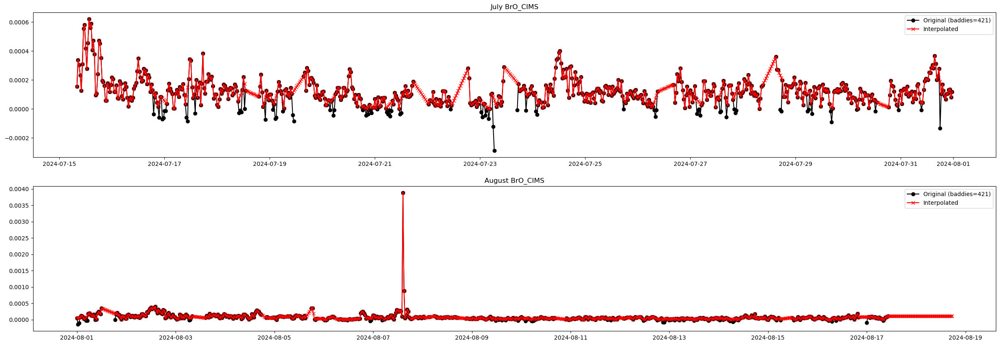

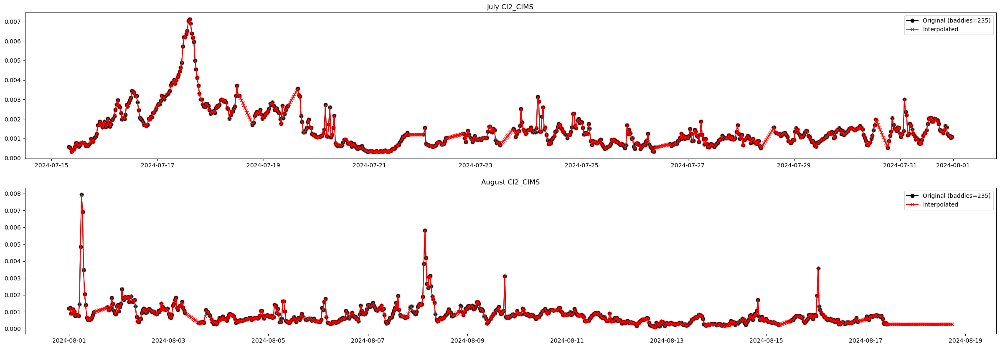

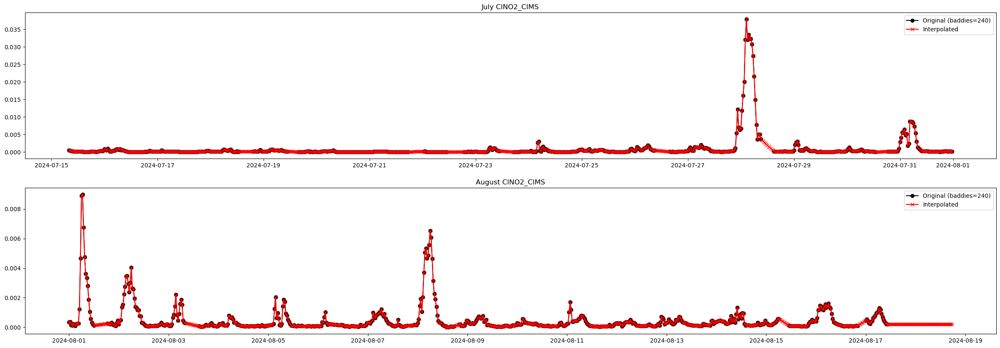

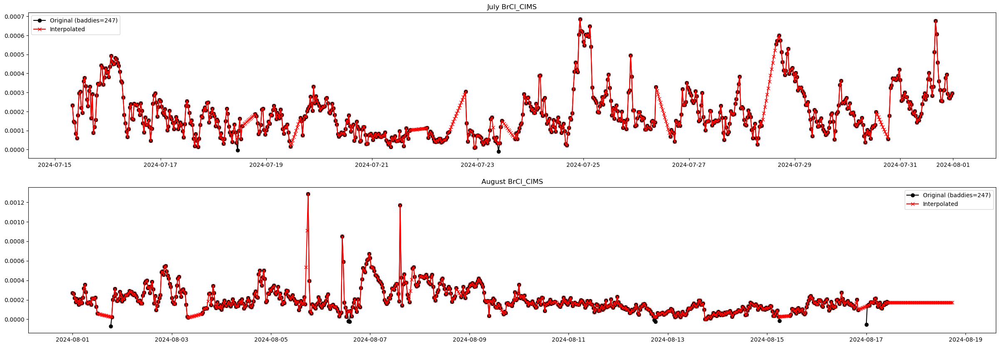

In [23]:
%matplotlib inline

df_interp=df_alldays.copy()

for i,col in enumerate(vars2fill):
    # Set any negative values to NaN so we can interp them... 
    df_interp[col] = df_interp[col].mask(df_interp[col] < 0, np.nan)
                               
    # Calc number of points that are negative or Nans: 
    n_baddies= len([item for item in df_alldays[col] if item <0 or np.isnan(item)]) 

    if n_baddies > 0: 
        #apply the linear interpolation
        df_interp[col] = df_interp[col].interpolate(method='linear')
        
        #Plot it so we can take a look at it... 
        fig, ax = plt.subplots(2,1,figsize = (30,10))

        ax[0].plot(df_alldays.index[0:828], df_alldays[col][0:828], color='k', marker='o',label=f'Original (baddies={n_baddies})')
        ax[0].plot(df_interp.index[0:828], df_interp[col][0:828], color='r', marker='x', label='Interpolated')
        ax[0].set_title('July ' + str(col))
        ax[0].legend()

        ax[1].plot(df_alldays.index[828:], df_alldays[col][828:], color='k', marker='o',label=f'Original (baddies={n_baddies})')
        ax[1].plot(df_interp.index[828:], df_interp[col][828:], color='r', marker='x', label='Interpolated')
        ax[1].set_title('August ' + str(col))
        ax[1].legend()
        